In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

In [2]:
%pylab inline
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

################################################################################

from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import glob
import cv2
import os
from datetime import datetime

################################################################################

import tensorflow.compat.v2 as tf
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.python.keras.losses import BinaryCrossentropy
from tensorflow.keras.applications.vgg16 import VGG16
from segmentation_models.losses import jaccard_loss, dice_loss, categorical_focal_loss, categorical_focal_jaccard_loss, categorical_focal_dice_loss

################################################################################
try :
    import import_ipynb
except :
    !pip install import-ipynb
    import import_ipynb
from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022 import *

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib
Segmentation Models: using `keras` framework.
importing Jupyter notebook from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022.ipynb


In [3]:
config = tf.compat.v1.ConfigProto( device_count = { 'GPU': 5 , 'CPU': 1 } )
sess = tf.compat.v1.Session( config = config )
keras.backend.set_session( sess )

In [4]:
tf.config.list_physical_devices("GPU")

[]

In [5]:
tf.__version__

'2.9.1'

In [6]:
keras.__version__

'2.9.0'

In [7]:
pd.__version__

'1.4.4'

In [8]:
np.__version__

'1.21.5'

In [9]:
model_name = "Transfert_learning_LinkNET"

# <strong> I - Acquisition des données à utiliserMaxNLocator

- ###  <strong> Chemin d'accès aux fichiers images et aux masks </strong>

In [10]:
chemin_image = os.getcwd()+"/datas/contraste/" 
chemin_masque_labelIds = os.getcwd()+"/datas/masque_labelIds/" 

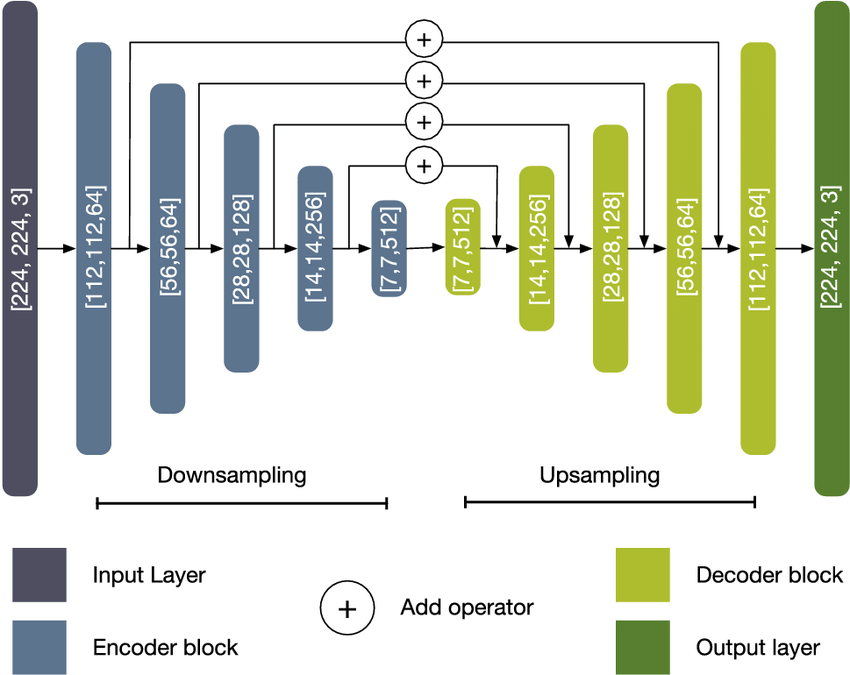

# <strong> II - Construction du modèle

- ###  <strong> definition </strong>

In [11]:
# Modèle UNET préentrainé sur Imagenet avec une couche de compression de type VGG16
def TL_LinkNET_model(input_shape, canaux_de_sortie ):
    
    from segmentation_models import Linknet

    model = Linknet( 
                    backbone_name='vgg16',
                    input_shape= input_shape,
                    classes=canaux_de_sortie,
                    activation='softmax',
                    weights=None,
                    encoder_weights='imagenet',
                    encoder_freeze=True,
                    encoder_features='default',
                    decoder_block_type='upsampling',
                    decoder_filters=(256, 128, 64, 32, 16),
                    decoder_use_batchnorm=True,
                  )

    model.summary()
    return model

# <strong> A - Sans augmentation de données avec fonction perte de type jaccard_loss

In [12]:
#resolution des images et masques
aug_1 = False
perte_1 = "jaccard_loss"
img_res = (128,256,3)

In [13]:
model_1 = TL_LinkNET_model( img_res , 8)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                             

In [14]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_1.compile(optimizer = Adam(lr = 2.e-2), 
                loss = jaccard_loss , 
                metrics = [ ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_1 = f"models/{model_name}_Loss={perte_1}_aug={aug_1}_/cp.ckpt"
checkpoint_dir_1 = os.path.dirname(checkpoint_path_1)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_1 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_1,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq=20
                                                  )
early_stopping_1 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_1 = False

In [15]:
if  charger_les_poids_1 :
    model_1.load_weights(checkpoint_path_1)
    
history_1 = model_1.fit_generator( 
    generator = MyImagesGenerator(chemin_image, chemin_masque_labelIds, 25, True, augmentation=aug_1, taille_des_donnees= 50, target_size=img_res ),
    validation_data = MyImagesGenerator(chemin_image, chemin_masque_labelIds, 10 , True, augmentation=aug_1, taille_des_donnees= 20, target_size=img_res ),
    epochs= 450,
    max_queue_size=12,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_1 , early_stopping_1] ,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_1.save(checkpoint_dir_1+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")


Epoch 1/450
2/2 [==============================] - 30s 16s/step - loss: 0.9278 - ARI_score: 2.0162 - mean_IoU: 0.0997 - dice_coeff: 0.1792 - Tversky_coef: 0.2073 - val_loss: 0.9580 - val_ARI_score: -0.8506 - val_mean_IoU: 0.1165 - val_dice_coeff: 0.2087 - val_Tversky_coef: 0.2095 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 28s 14s/step - loss: 0.8470 - ARI_score: 2.0239 - mean_IoU: 0.2484 - dice_coeff: 0.3956 - Tversky_coef: 0.2268 - val_loss: 0.9518 - val_ARI_score: 0.6533 - val_mean_IoU: 0.0932 - val_dice_coeff: 0.1701 - val_Tversky_coef: 0.2061 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 27s 14s/step - loss: 0.7666 - ARI_score: 1.2904 - mean_IoU: 0.3524 - dice_coeff: 0.5211 - Tversky_coef: 0.2376 - val_loss: 0.9223 - val_ARI_score: -4.0198 - val_mean_IoU: 0.1246 - val_dice_coeff: 0.2214 - val_Tversky_coef: 0.2107 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 28s 15s/step - loss: 0.7191 - ARI_score: 4.4387 - mean_IoU: 0.3995 -

In [16]:
result_1  = pd.DataFrame( history_1.history )
result_1.drop(["lr"], axis=1, inplace=True)
result_1["modèle"] = [model_name for _ in range( result_1.shape[0])]
result_1["Loss"] = [perte_1 for _ in range( result_1.shape[0])]
result_1["Augmentation"] = [aug_1 for _ in range( result_1.shape[0])]
result_1.to_csv( f"{model_name}_loss={perte_1}_augment={aug_1}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index = False )
result_1

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.927792,2.016188,0.099705,0.179217,0.207266,0.957977,-0.850602,0.116516,0.208650,0.209519,Transfert_learning_LinkNET,jaccard_loss,False
1,0.846987,2.023905,0.248440,0.395640,0.226817,0.951825,0.653291,0.093221,0.170074,0.206131,Transfert_learning_LinkNET,jaccard_loss,False
2,0.766565,1.290381,0.352422,0.521107,0.237641,0.922310,-4.019811,0.124590,0.221423,0.210665,Transfert_learning_LinkNET,jaccard_loss,False
3,0.719087,4.438694,0.399505,0.570916,0.241866,0.933580,-1.421914,0.094083,0.171945,0.206314,Transfert_learning_LinkNET,jaccard_loss,False
4,0.688058,-2.101307,0.438905,0.609388,0.245139,0.952747,1.574788,0.053537,0.101627,0.200104,Transfert_learning_LinkNET,jaccard_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
120,0.299768,-1.453223,0.806348,0.892774,0.269893,0.577221,0.859281,0.576434,0.731275,0.255720,Transfert_learning_LinkNET,jaccard_loss,False
121,0.308421,0.243532,0.799930,0.888834,0.269547,0.535199,-2.191455,0.594733,0.745217,0.256957,Transfert_learning_LinkNET,jaccard_loss,False
122,0.308767,-2.024903,0.798122,0.887697,0.269450,0.568010,1.986356,0.589767,0.741954,0.256662,Transfert_learning_LinkNET,jaccard_loss,False
123,0.310493,-0.244919,0.800694,0.889294,0.269586,0.539370,0.866505,0.604331,0.751059,0.257470,Transfert_learning_LinkNET,jaccard_loss,False


In [17]:
start = 2

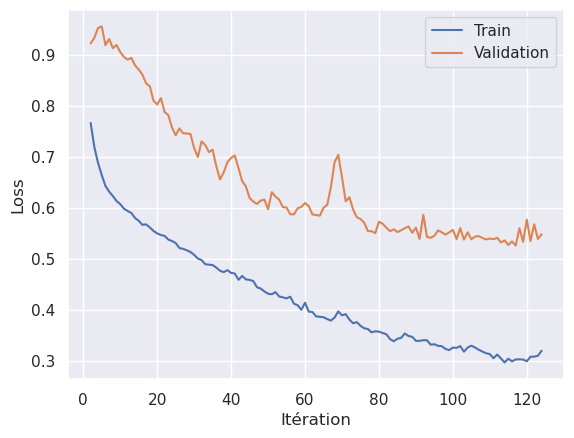

In [18]:
plt.plot(result_1.index[start:], result_1["loss"][start:])
plt.plot(result_1.index[start:], result_1["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


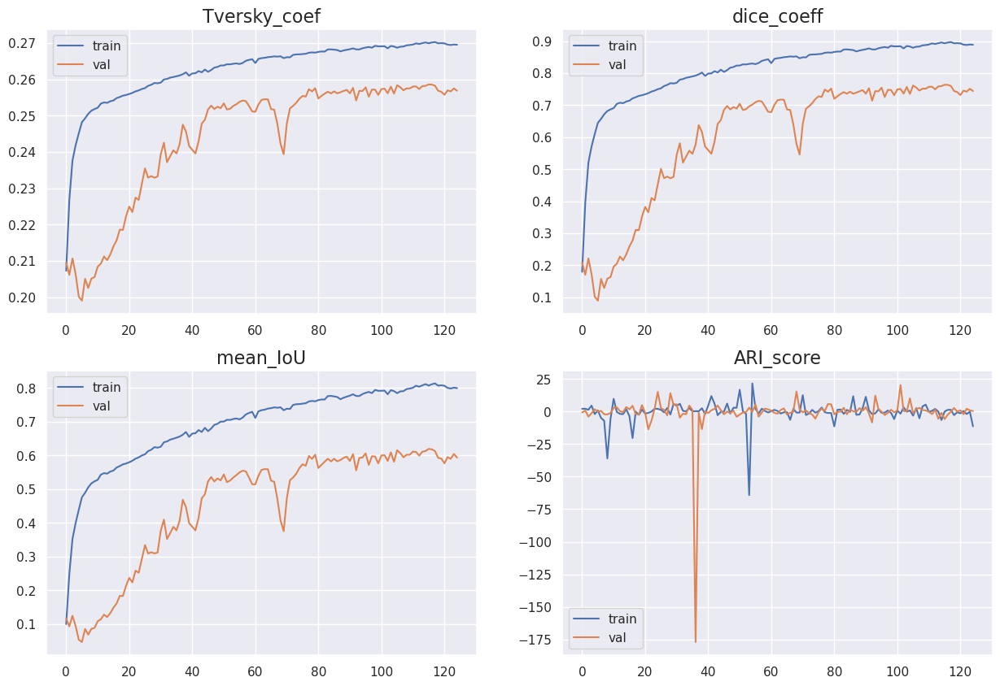

In [19]:
afficher_les_metriques( result_1 )

In [20]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_1, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [21]:
img.shape

(10, 128, 256, 3)

In [22]:
mask.shape

(10, 128, 256, 8)

In [23]:
mask_pred = model_1.predict(img)

1/1 [==============================] - 1s 1s/step


In [24]:
mask_pred.shape

(10, 128, 256, 8)

In [25]:
transformer = Mask_To_8_Groups( )

In [26]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred ]

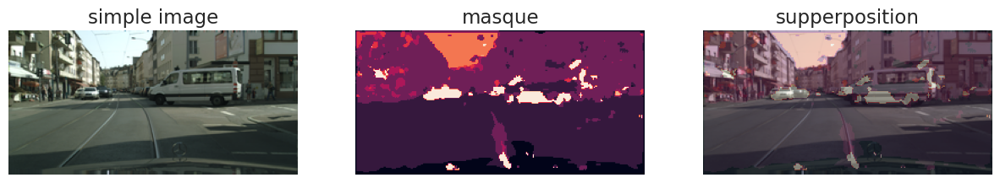

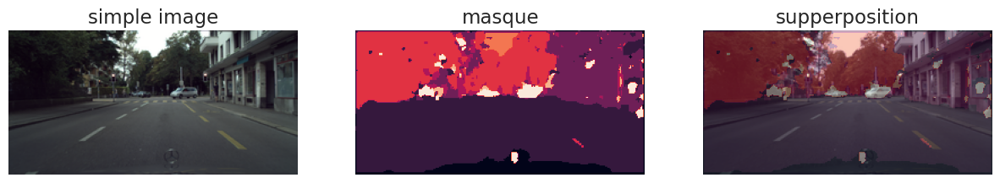

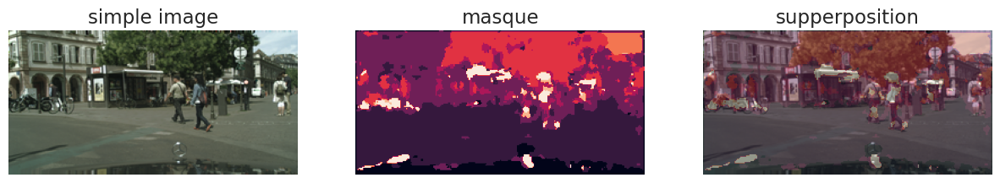

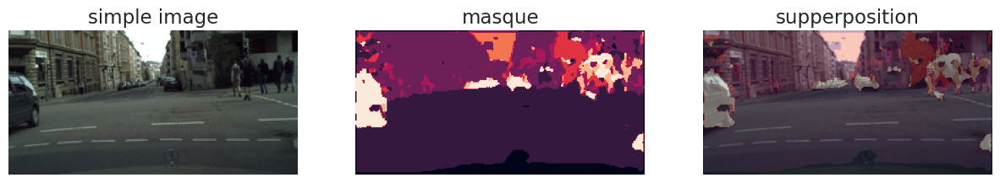

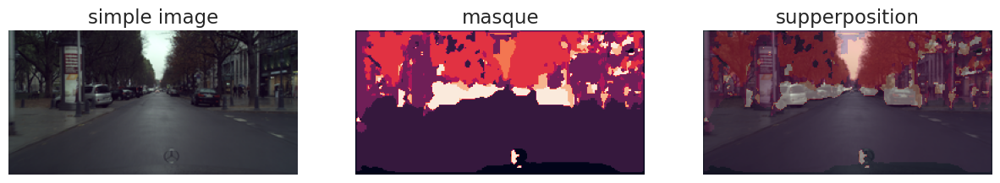

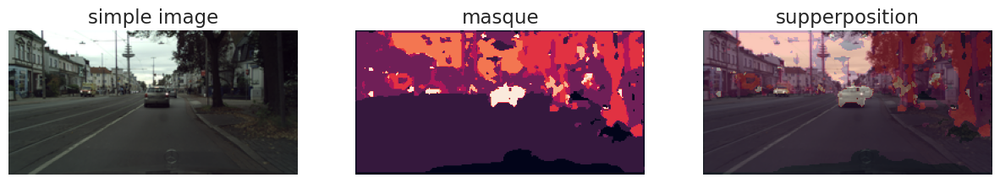

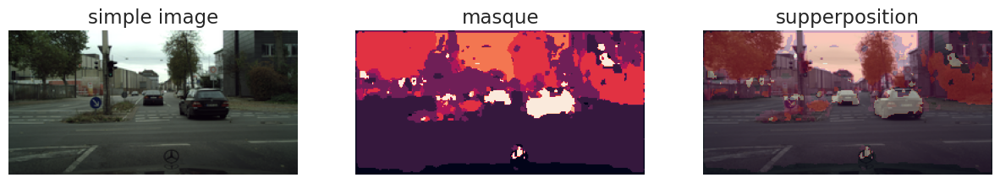

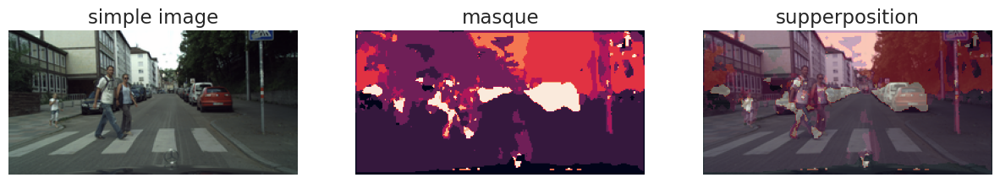

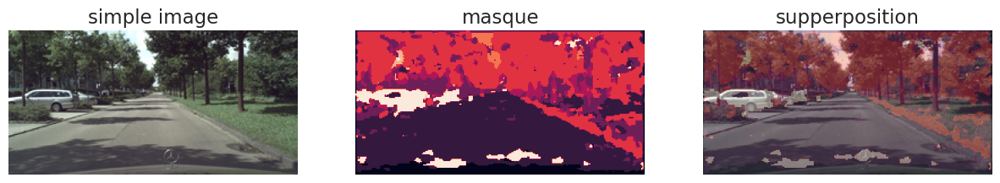

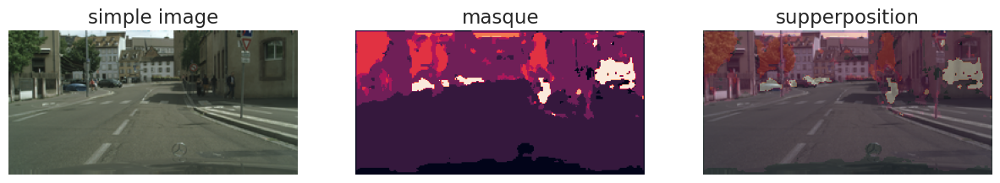

In [27]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> B - Sans augmentation de données et fonction perte de type dice_loss

In [28]:
#resolution des images et masques
aug_2 = False
perte_2 = "dice_loss"
img_res = (128,256,3)

In [29]:
model_2 = TL_LinkNET_model( img_res , 8)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [30]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_2.compile(optimizer = Adam(lr = 2.e-2),
                loss = dice_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_2 = f"models/{model_name}_Loss={perte_2}_aug={aug_2}_/cp.ckpt"
checkpoint_dir_2 = os.path.dirname(checkpoint_path_2)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_2 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_2,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 20
                                                  )
early_stopping_2 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_2 = False

In [31]:
if charger_les_poids_2 : 
    model_2.load_weights(checkpoint_path_2)
    

history_2 = model_2.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_2, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_2, taille_des_donnees= 20, target_size=img_res),
    epochs=450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_2, early_stopping_2 ],
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_2.save(checkpoint_dir_2+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 31s 16s/step - loss: 0.7974 - ARI_score: 2.0280 - mean_IoU: 0.1143 - dice_coeff: 0.2026 - Tversky_coef: 0.2096 - val_loss: 0.7570 - val_ARI_score: 1.6014 - val_mean_IoU: 0.1384 - val_dice_coeff: 0.2430 - val_Tversky_coef: 0.2125 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 29s 15s/step - loss: 0.5627 - ARI_score: 2.0286 - mean_IoU: 0.2802 - dice_coeff: 0.4373 - Tversky_coef: 0.2302 - val_loss: 0.7280 - val_ARI_score: 3.8459 - val_mean_IoU: 0.1575 - val_dice_coeff: 0.2720 - val_Tversky_coef: 0.2151 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 28s 14s/step - loss: 0.4782 - ARI_score: 1.4235 - mean_IoU: 0.3531 - dice_coeff: 0.5218 - Tversky_coef: 0.2375 - val_loss: 0.7414 - val_ARI_score: 119.5974 - val_mean_IoU: 0.1485 - val_dice_coeff: 0.2586 - val_Tversky_coef: 0.2139 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 27s 14s/step - loss: 0.4393 - ARI_score: 5.6159 - mean_IoU: 0.3897 -

In [32]:
result_2  = pd.DataFrame( history_2.history )
result_2.drop(["lr"], axis = 1, inplace = True)
result_2["modèle"] = [model_name for _ in range( result_2.shape[0])]
result_2["Loss"] = [perte_2 for _ in range( result_2.shape[0])]
result_2["Augmentation"] = [aug_2 for _ in range( result_2.shape[0])]
result_2.to_csv(f"{model_name}_loss={perte_2}_augment={aug_2}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_2

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.797376,2.027995,0.114315,0.202624,0.209575,0.756986,1.601407,0.138363,0.243014,0.212547,Transfert_learning_LinkNET,dice_loss,False
1,0.562685,2.028577,0.280157,0.437315,0.230221,0.727974,3.845949,0.157500,0.272026,0.215129,Transfert_learning_LinkNET,dice_loss,False
2,0.478240,1.423494,0.353074,0.521760,0.237547,0.741389,119.597382,0.148516,0.258611,0.213879,Transfert_learning_LinkNET,dice_loss,False
3,0.439313,5.615859,0.389662,0.560687,0.240851,0.748950,-12.289610,0.143656,0.251050,0.213181,Transfert_learning_LinkNET,dice_loss,False
4,0.407922,0.279339,0.420772,0.592078,0.243557,0.747981,-1.263247,0.144383,0.252019,0.213270,Transfert_learning_LinkNET,dice_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,0.281435,0.664310,0.560775,0.718565,0.254588,0.349223,1.917965,0.482364,0.650777,0.248494,Transfert_learning_LinkNET,dice_loss,False
88,0.281050,4.593186,0.561253,0.718950,0.254621,0.351972,18.009230,0.480146,0.648028,0.248253,Transfert_learning_LinkNET,dice_loss,False
89,0.283008,-5.335286,0.559312,0.716992,0.254451,0.356829,0.047820,0.474339,0.643171,0.247824,Transfert_learning_LinkNET,dice_loss,False
90,0.283203,-2.800287,0.558601,0.716797,0.254432,0.345542,2.981326,0.488063,0.654458,0.248815,Transfert_learning_LinkNET,dice_loss,False


In [33]:
start = 0

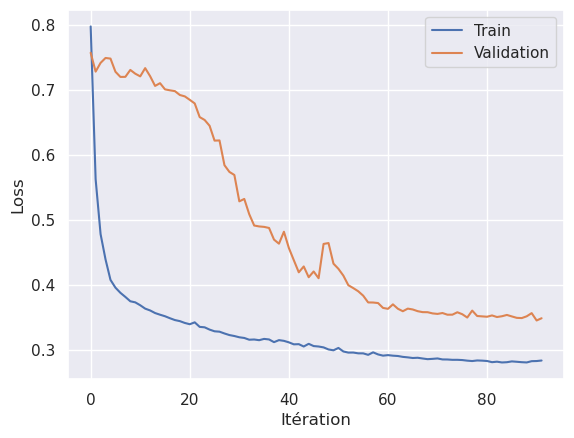

In [34]:
plt.plot(result_2.index[start:], result_2["loss"][start:])
plt.plot(result_2.index[start:], result_2["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


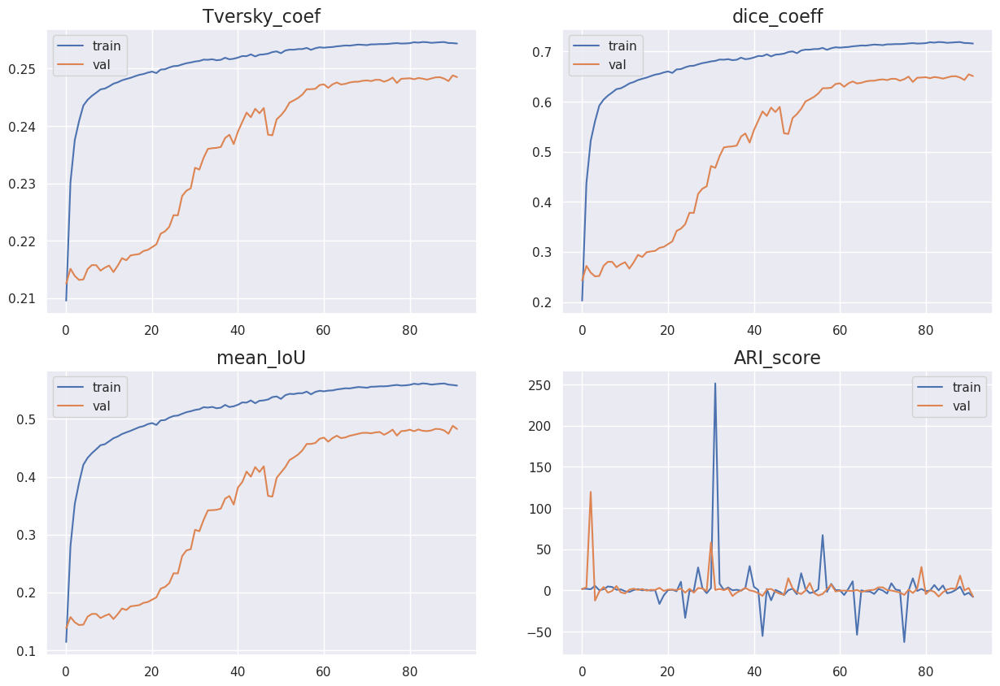

In [35]:
afficher_les_metriques( result_2 )

In [36]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_2, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [37]:
img.shape

(10, 128, 256, 3)

In [38]:
mask.shape

(10, 128, 256, 8)

In [39]:
mask_pred = model_2.predict(img)

1/1 [==============================] - 1s 1s/step


In [40]:
mask_pred.shape

(10, 128, 256, 8)

In [41]:
transformer = Mask_To_8_Groups()

In [42]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

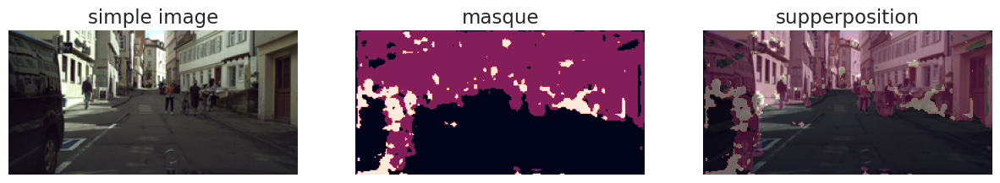

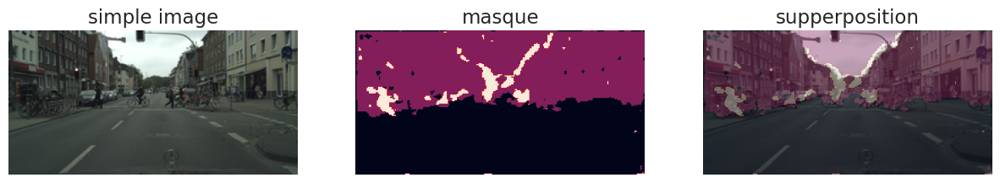

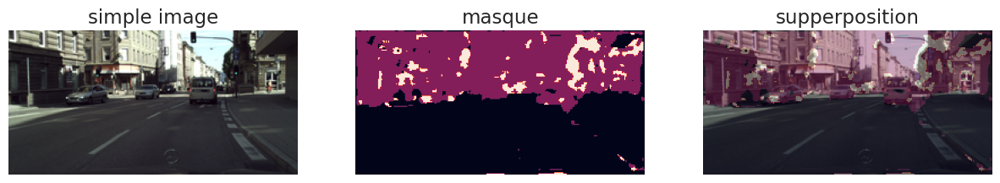

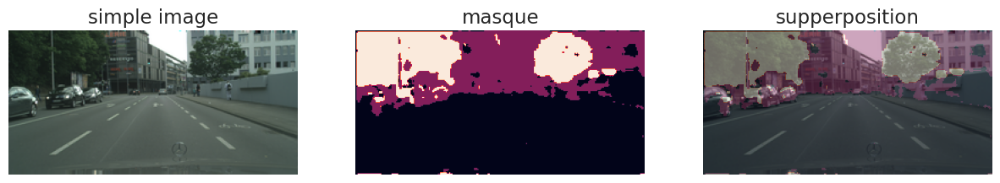

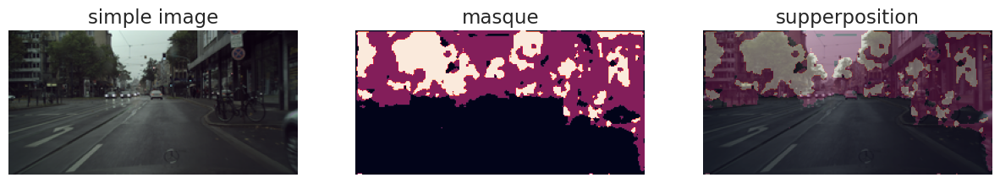

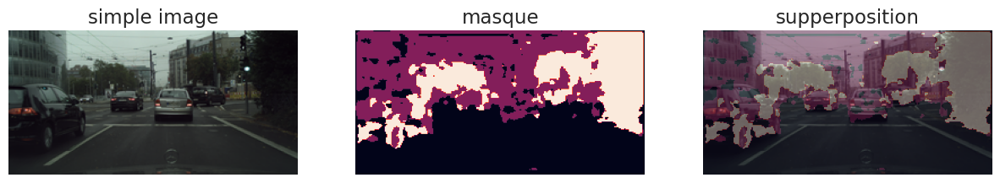

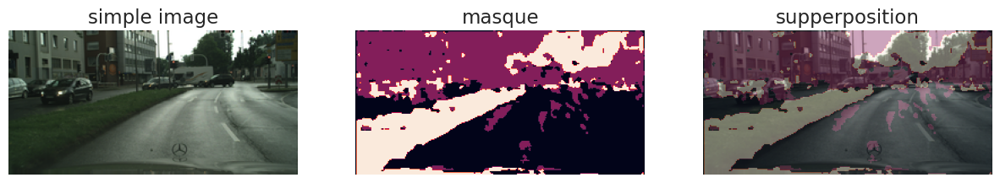

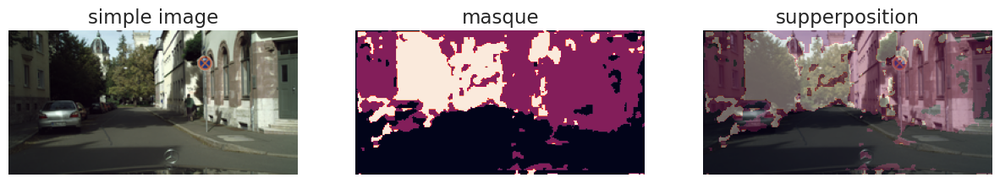

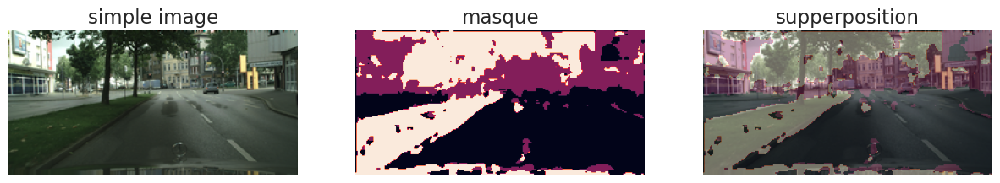

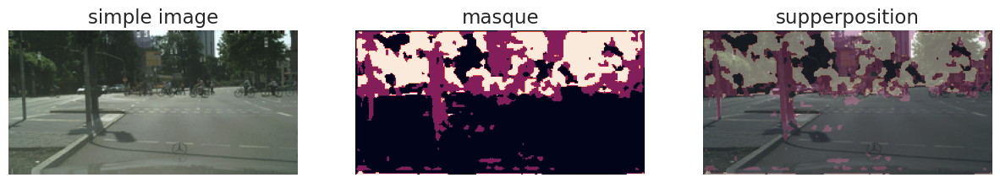

In [43]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> C - Sans augmentation de données avec fonction perte de type categorical_focal_loss

In [44]:
#resolution des images et masques
aug_3 = False
perte_3 = "categorical_focal_loss"
img_res = (128,256,3)

In [45]:
model_3 = TL_LinkNET_model( img_res , 8)

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [46]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_3.compile(optimizer = Adam(lr = 2.e-2),
                loss = categorical_focal_loss ,
                metrics = [ARI_score, mean_IoU,dice_coeff, Tversky_coef ],
                run_eagerly=True 
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_3 = f"models/{model_name}_Loss={perte_3}_aug={aug_3}_/cp.ckpt"
checkpoint_dir_3 = os.path.dirname(checkpoint_path_3)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_3 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_3,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 20
                                                  )
early_stopping_3 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_3 = False

In [47]:
if charger_les_poids_3 :
    model_3.load_weights(checkpoint_path_3)
    

history_3 = model_3.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_3, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_3, taille_des_donnees= 20, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_3, early_stopping_3 ],
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_3.save(checkpoint_dir_3+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 30s 16s/step - loss: 0.0466 - ARI_score: 2.0087 - mean_IoU: 0.1078 - dice_coeff: 0.1926 - Tversky_coef: 0.2085 - val_loss: 0.1438 - val_ARI_score: 3.8525 - val_mean_IoU: 0.1266 - val_dice_coeff: 0.2247 - val_Tversky_coef: 0.2114 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 27s 13s/step - loss: 0.0304 - ARI_score: 1.9615 - mean_IoU: 0.2295 - dice_coeff: 0.3730 - Tversky_coef: 0.2249 - val_loss: 0.1083 - val_ARI_score: 0.1926 - val_mean_IoU: 0.1508 - val_dice_coeff: 0.2621 - val_Tversky_coef: 0.2147 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 28s 14s/step - loss: 0.0254 - ARI_score: 2.0087 - mean_IoU: 0.2335 - dice_coeff: 0.3785 - Tversky_coef: 0.2256 - val_loss: 0.1228 - val_ARI_score: -3.3245 - val_mean_IoU: 0.1494 - val_dice_coeff: 0.2598 - val_Tversky_coef: 0.2144 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 28s 13s/step - loss: 0.0235 - ARI_score: 2.0089 - mean_IoU: 0.2491 - 

In [48]:
result_3  = pd.DataFrame( history_3.history )
result_3.drop(["lr"], axis = 1, inplace = True)
result_3["modèle"] = [model_name for _ in range( result_3.shape[0])]
result_3["Loss"] = [perte_3 for _ in range( result_3.shape[0])]
result_3["Augmentation"] = [aug_3 for _ in range( result_3.shape[0])]
result_3.to_csv(f"{model_name}_loss={perte_3}_augment={aug_3}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_3

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.046557,2.008664,0.107834,0.192577,0.208530,0.143761,3.852490,0.126561,0.224678,0.211376,Transfert_learning_LinkNET,categorical_focal_loss,False
1,0.030386,1.961506,0.229480,0.373018,0.224940,0.108305,0.192578,0.150825,0.262105,0.214749,Transfert_learning_LinkNET,categorical_focal_loss,False
2,0.025392,2.008710,0.233484,0.378511,0.225594,0.122755,-3.324478,0.149417,0.259814,0.214361,Transfert_learning_LinkNET,categorical_focal_loss,False
3,0.023474,2.008886,0.249124,0.398863,0.227452,0.097651,0.180363,0.177551,0.301214,0.218059,Transfert_learning_LinkNET,categorical_focal_loss,False
4,0.021692,2.016445,0.273220,0.429144,0.230138,0.103673,-6.171602,0.145148,0.253282,0.213807,Transfert_learning_LinkNET,categorical_focal_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,0.010906,1.975631,0.447825,0.618611,0.246855,0.020782,2.011509,0.330523,0.496334,0.235970,Transfert_learning_LinkNET,categorical_focal_loss,False
57,0.011021,2.005357,0.450545,0.621158,0.247084,0.020287,2.012786,0.340543,0.507972,0.236986,Transfert_learning_LinkNET,categorical_focal_loss,False
58,0.010742,2.006726,0.451698,0.622270,0.247196,0.020316,2.011376,0.334518,0.501033,0.236387,Transfert_learning_LinkNET,categorical_focal_loss,False
59,0.010724,2.009084,0.455832,0.626144,0.247509,0.021037,2.021056,0.328780,0.493445,0.235727,Transfert_learning_LinkNET,categorical_focal_loss,False


In [49]:
start = 3

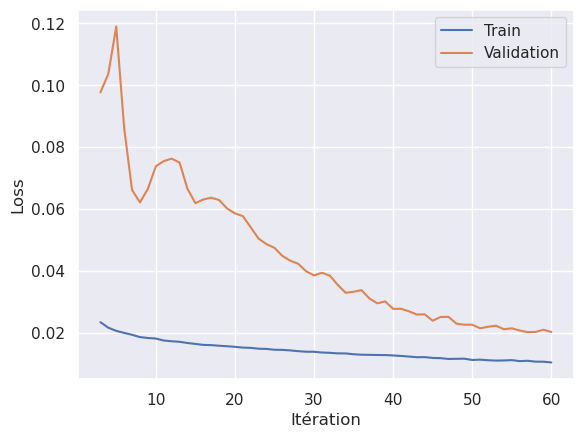

In [50]:
plt.plot(result_3.index[start:], result_3["loss"][start:])
plt.plot(result_3.index[start:], result_3["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


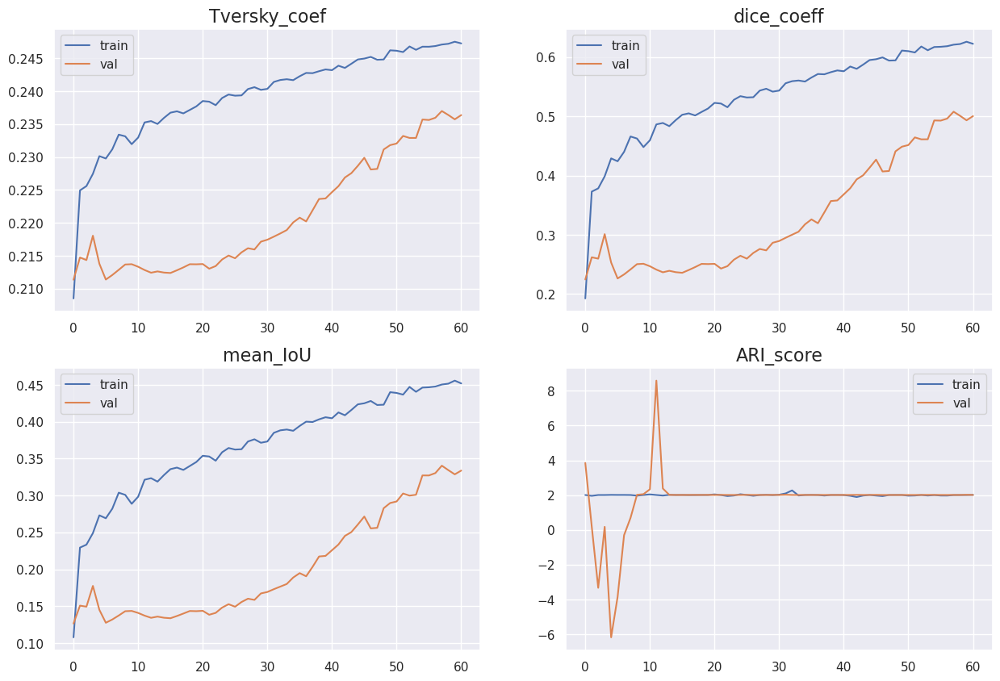

In [51]:
afficher_les_metriques( result_3 )

In [52]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_3, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [53]:
img.shape

(10, 128, 256, 3)

In [54]:
mask.shape

(10, 128, 256, 8)

In [55]:
mask_pred = model_3.predict(img)

1/1 [==============================] - 1s 1s/step


In [56]:
mask_pred.shape

(10, 128, 256, 8)

In [57]:
transformer = Mask_To_8_Groups()

In [58]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

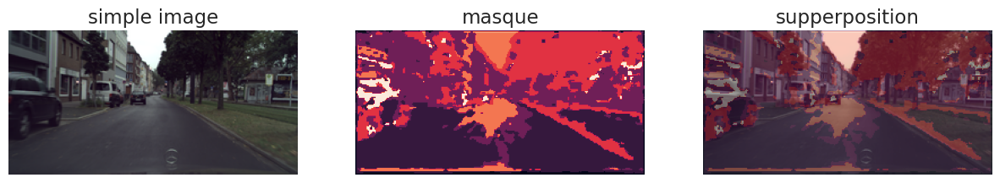

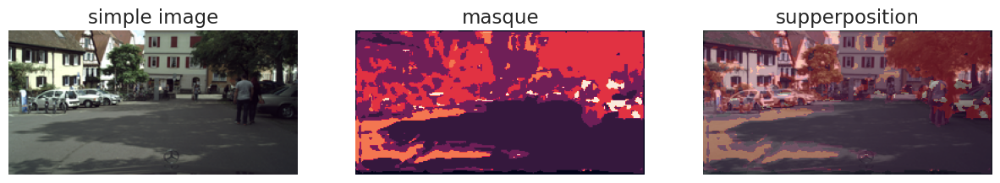

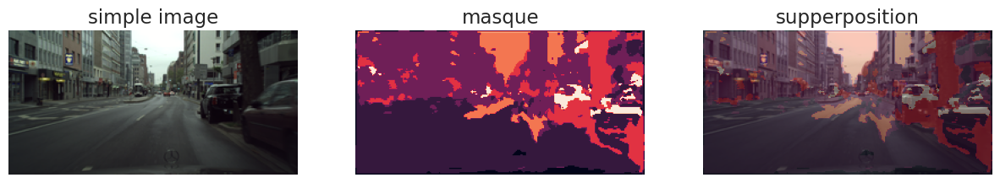

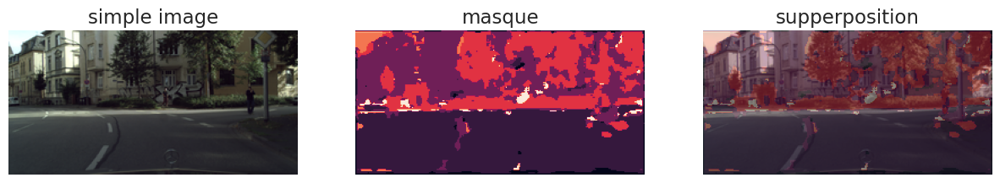

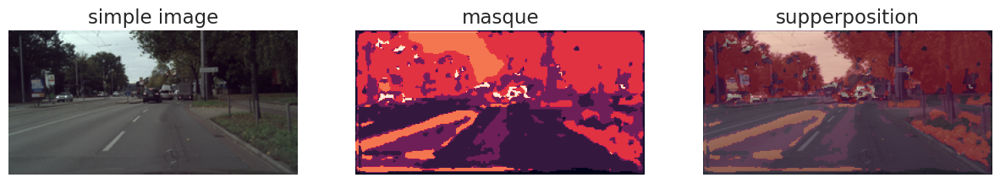

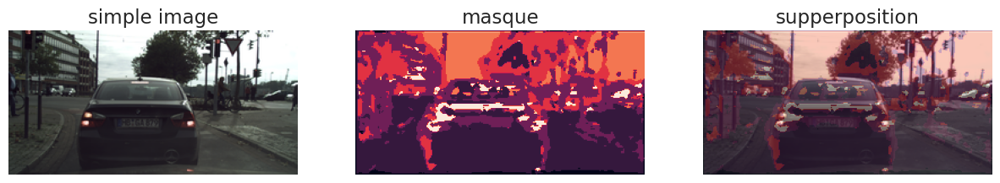

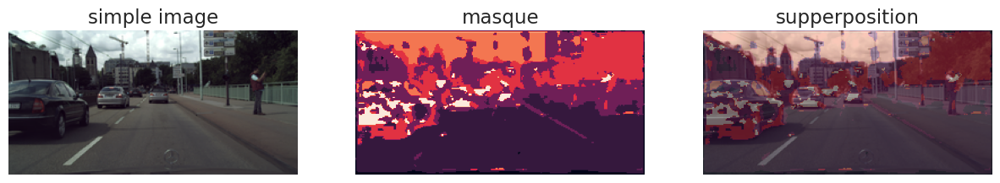

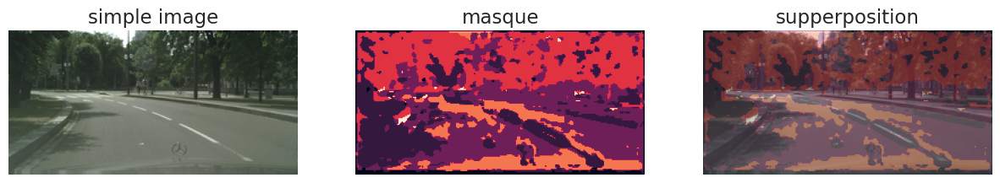

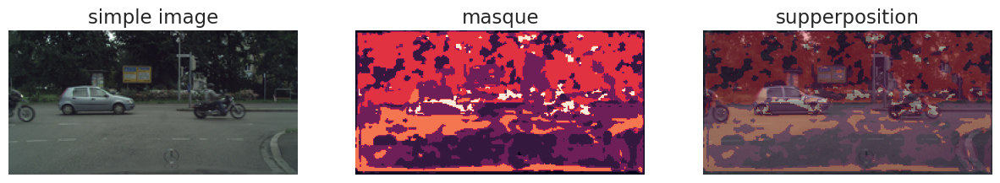

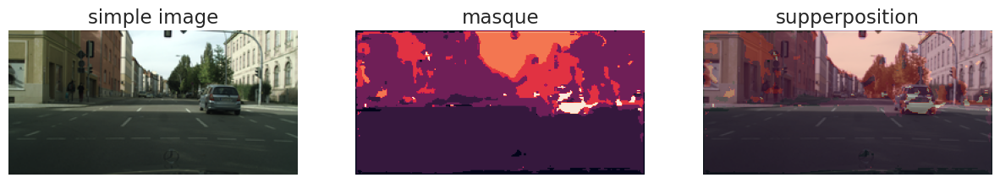

In [59]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> D - Sans augmentation de données avec fonction perte de type categorical_focal_jaccard_loss

In [60]:
#resolution des images et masques
aug_4 = False
perte_4 = "categorical_focal_jaccard_loss"
img_res = (128,256,3)

In [61]:
model_4 = TL_LinkNET_model( img_res , 8)

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [62]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_4.compile(optimizer = Adam(lr = 2.e-2 ),
                loss = categorical_focal_jaccard_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_4 = f"models/{model_name}_Loss={perte_4}_aug={aug_4}_/cp.ckpt"
checkpoint_dir_4 = os.path.dirname(checkpoint_path_4)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_4 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_4,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 20
                                                  )
early_stopping_4 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=15,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_4 = False

In [63]:
if charger_les_poids_4  :
    model_4.load_weights(checkpoint_path_4)
    
    
history_4 = model_4.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_4, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_4, taille_des_donnees= 20, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_4, early_stopping_4 ] ,
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_4.save(checkpoint_dir_4+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 34s 18s/step - loss: 0.9850 - ARI_score: 1.9889 - mean_IoU: 0.1052 - dice_coeff: 0.1875 - Tversky_coef: 0.2080 - val_loss: 1.2673 - val_ARI_score: -1.1525 - val_mean_IoU: 0.1408 - val_dice_coeff: 0.2469 - val_Tversky_coef: 0.2129 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 32s 17s/step - loss: 0.9242 - ARI_score: 1.9892 - mean_IoU: 0.2438 - dice_coeff: 0.3905 - Tversky_coef: 0.2264 - val_loss: 1.2513 - val_ARI_score: -0.0842 - val_mean_IoU: 0.1444 - val_dice_coeff: 0.2524 - val_Tversky_coef: 0.2134 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 33s 17s/step - loss: 0.8840 - ARI_score: 1.9892 - mean_IoU: 0.3092 - dice_coeff: 0.4723 - Tversky_coef: 0.2334 - val_loss: 1.2797 - val_ARI_score: -0.8483 - val_mean_IoU: 0.0595 - val_dice_coeff: 0.1123 - val_Tversky_coef: 0.2009 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 32s 16s/step - loss: 0.8418 - ARI_score: 1.9845 - mean_IoU: 0.3459 

In [64]:
result_4  = pd.DataFrame( history_4.history )
result_4.drop(["lr"], axis = 1, inplace = True)
result_4["modèle"] = [model_name for _ in range( result_4.shape[0])]
result_4["Loss"] = [perte_4 for _ in range( result_4.shape[0])]
result_4["Augmentation"] = [aug_4 for _ in range( result_4.shape[0])]
result_4.to_csv(f"{model_name}_loss={perte_4}_augment={aug_4}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_4

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.985039,1.988936,0.105189,0.187473,0.208008,1.267287,-1.152476,0.140848,0.246871,0.212883,Transfert_learning_LinkNET,categorical_focal_jaccard_loss,False
1,0.924154,1.989249,0.243792,0.390509,0.226372,1.251325,-0.084219,0.144438,0.252415,0.213375,Transfert_learning_LinkNET,categorical_focal_jaccard_loss,False
2,0.884047,1.989196,0.309195,0.472342,0.233368,1.279695,-0.848250,0.059512,0.112334,0.200860,Transfert_learning_LinkNET,categorical_focal_jaccard_loss,False
3,0.841765,1.984468,0.345883,0.513896,0.237040,1.246965,-1.174945,0.120047,0.214206,0.209935,Transfert_learning_LinkNET,categorical_focal_jaccard_loss,False
4,0.785759,1.741306,0.401675,0.572514,0.242116,1.276477,-0.559619,0.110740,0.199372,0.208666,Transfert_learning_LinkNET,categorical_focal_jaccard_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,0.252549,-1.342130,0.846869,0.917080,0.272075,0.637427,-9.199942,0.562838,0.720247,0.254746,Transfert_learning_LinkNET,categorical_focal_jaccard_loss,False
215,0.250653,-2.957943,0.848434,0.917976,0.272151,0.623914,2.204066,0.572900,0.728152,0.255441,Transfert_learning_LinkNET,categorical_focal_jaccard_loss,False
216,0.249269,2.777741,0.847743,0.917598,0.272121,0.624297,4.789884,0.573402,0.728724,0.255495,Transfert_learning_LinkNET,categorical_focal_jaccard_loss,False
217,0.260022,-0.996892,0.844437,0.915630,0.271953,0.631631,1.690154,0.571957,0.727615,0.255386,Transfert_learning_LinkNET,categorical_focal_jaccard_loss,False


In [65]:
start = 0

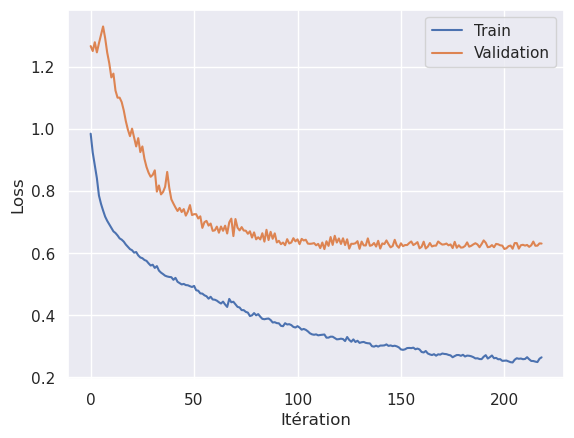

In [66]:
plt.plot(result_4.index[start:], result_4["loss"][start:])
plt.plot(result_4.index[start:], result_4["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


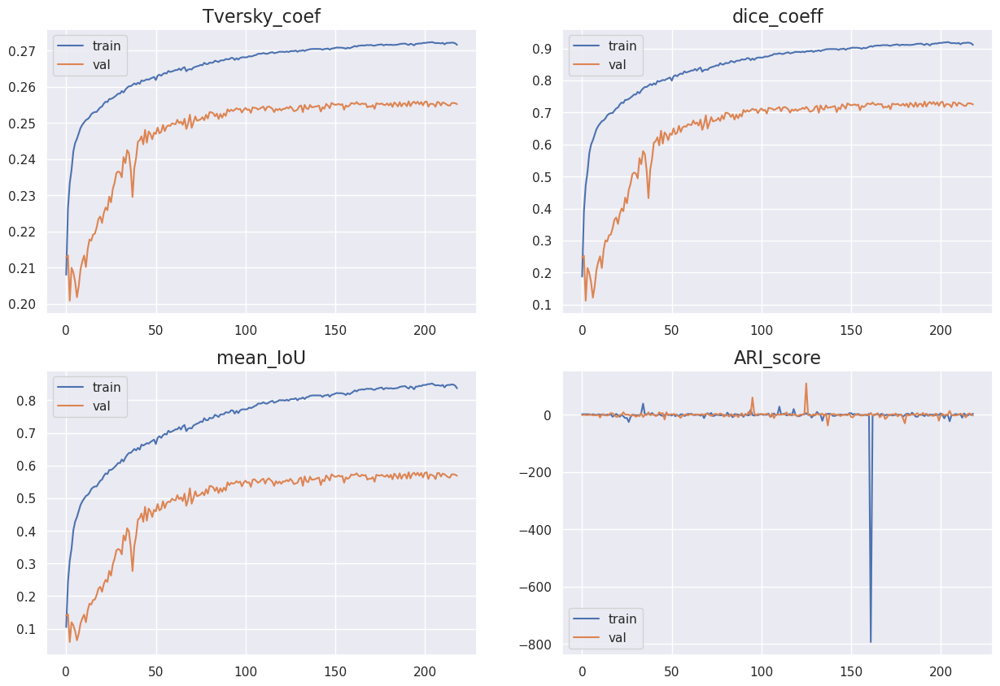

In [67]:
afficher_les_metriques( result_4 )

In [68]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, False, augmentation=aug_4, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [69]:
img.shape

(10, 128, 256, 3)

In [70]:
mask.shape

(10, 128, 256, 8)

In [71]:
mask_pred = model_4.predict(img)

1/1 [==============================] - 1s 1s/step


In [72]:
mask_pred.shape

(10, 128, 256, 8)

In [73]:
transformer = Mask_To_8_Groups()

In [74]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

In [75]:
np.unique( mask_pred )

array([0, 1, 2, 3, 4, 5, 6, 7])

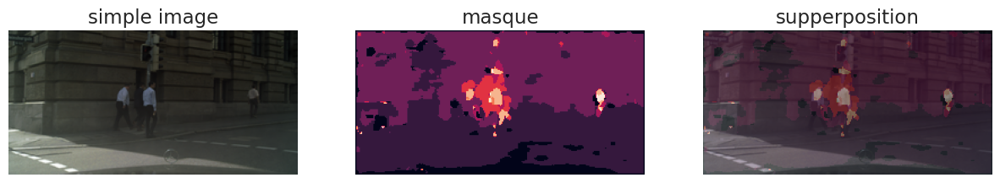

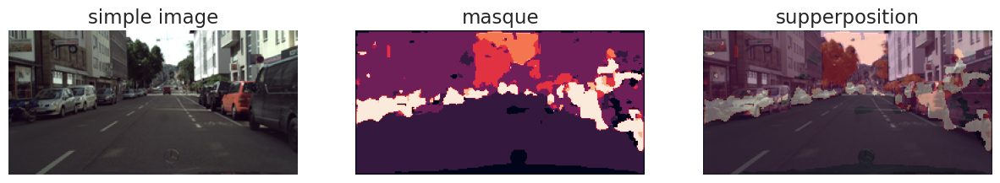

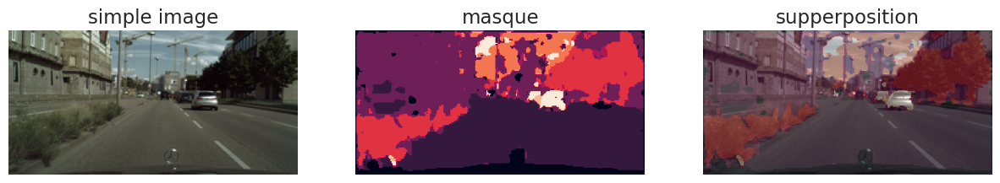

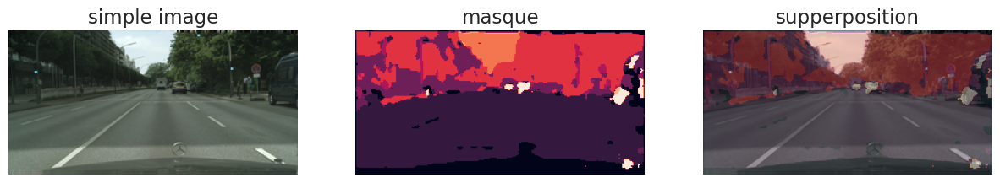

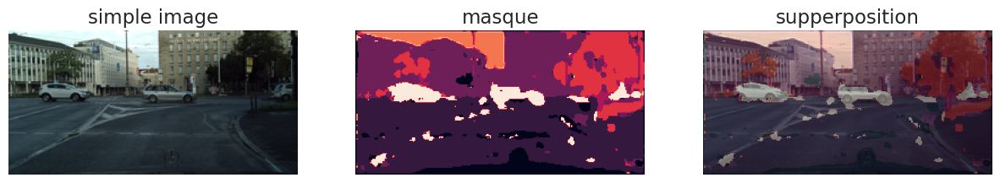

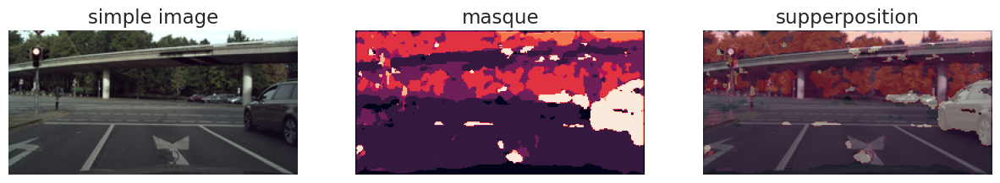

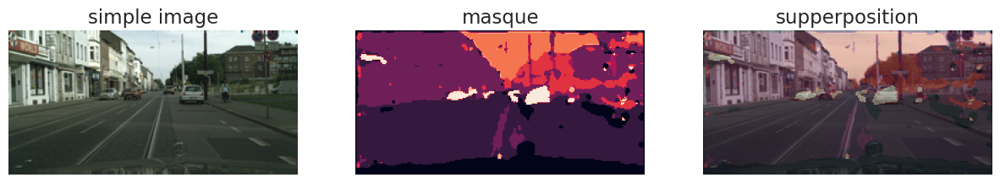

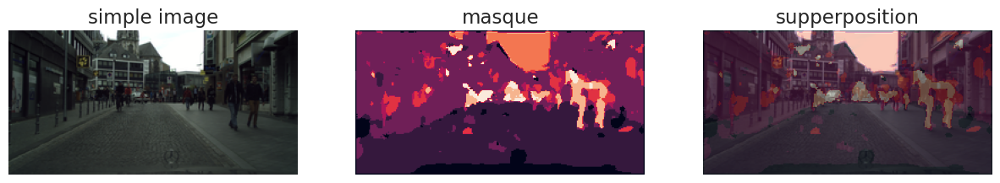

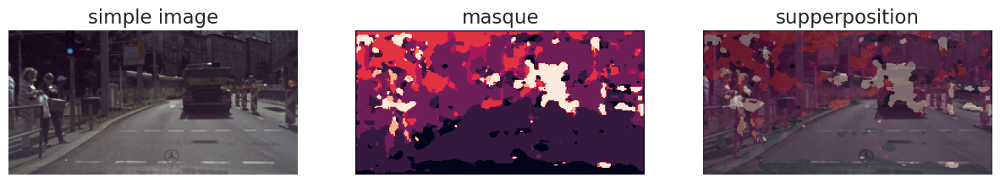

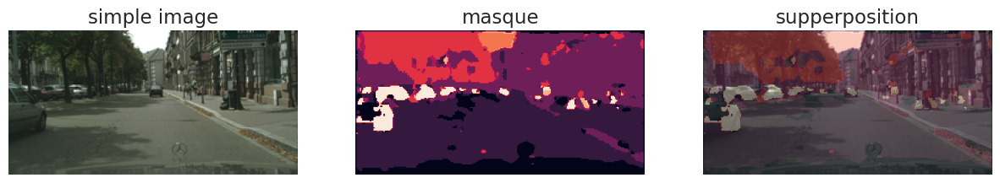

In [76]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> E - Sans augmentation de données avec fonction perte de type categorical_focal_dice_loss

In [77]:
#resolution des images et masques
aug_5 = False
perte_5 = "categorical_focal_dice_loss"
img_res = (128,256,3)

In [78]:
model_5 = TL_LinkNET_model( img_res , 8)

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [79]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_5.compile(optimizer = Adam(lr = 2.e-2 ),
                loss = categorical_focal_dice_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_5 = f"models/{model_name}_Loss={perte_5}_aug={aug_5}_/cp.ckpt"
checkpoint_dir_5 = os.path.dirname(checkpoint_path_5)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_5 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_5,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 20
                                                  )
early_stopping_5 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=15,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_5 = False

In [80]:
if charger_les_poids_5  :
    model_5.load_weights(checkpoint_path_5)
    
    
history_5 = model_5.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_5, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_5, taille_des_donnees= 20, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_5, early_stopping_5 ] ,
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_5.save(checkpoint_dir_5+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 27s 15s/step - loss: 0.9318 - ARI_score: 2.0039 - mean_IoU: 0.0996 - dice_coeff: 0.1792 - Tversky_coef: 0.2072 - val_loss: 1.2869 - val_ARI_score: -30.4756 - val_mean_IoU: 0.0966 - val_dice_coeff: 0.1761 - val_Tversky_coef: 0.2066 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 25s 13s/step - loss: 0.8256 - ARI_score: 2.0099 - mean_IoU: 0.2629 - dice_coeff: 0.4147 - Tversky_coef: 0.2285 - val_loss: 1.2364 - val_ARI_score: 4.4816 - val_mean_IoU: 0.1038 - val_dice_coeff: 0.1881 - val_Tversky_coef: 0.2077 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 25s 13s/step - loss: 0.7380 - ARI_score: 1.9439 - mean_IoU: 0.3410 - dice_coeff: 0.5085 - Tversky_coef: 0.2367 - val_loss: 1.1973 - val_ARI_score: 0.6669 - val_mean_IoU: 0.0884 - val_dice_coeff: 0.1624 - val_Tversky_coef: 0.2055 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 26s 13s/step - loss: 0.6698 - ARI_score: 4.0934 - mean_IoU: 0.3731 -

In [81]:
result_5  = pd.DataFrame( history_5.history )
result_5.drop(["lr"], axis = 1, inplace = True)
result_5["modèle"] = [model_name for _ in range( result_5.shape[0])]
result_5["Loss"] = [perte_5 for _ in range( result_5.shape[0])]
result_5["Augmentation"] = [aug_5 for _ in range( result_5.shape[0])]
result_5.to_csv(f"{model_name}_loss={perte_5}_augment={aug_5}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_5

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.931761,2.003872,0.099556,0.179191,0.207248,1.286858,-30.475590,0.096602,0.176082,0.206636,Transfert_learning_LinkNET,categorical_focal_dice_loss,False
1,0.825559,2.009920,0.262878,0.414655,0.228469,1.236371,4.481575,0.103819,0.188083,0.207694,Transfert_learning_LinkNET,categorical_focal_dice_loss,False
2,0.737959,1.943940,0.340968,0.508520,0.236743,1.197342,0.666897,0.088414,0.162417,0.205478,Transfert_learning_LinkNET,categorical_focal_dice_loss,False
3,0.669781,4.093407,0.373051,0.543384,0.239672,1.284810,2.231576,0.105403,0.190700,0.207901,Transfert_learning_LinkNET,categorical_focal_dice_loss,False
4,0.630241,-4.219603,0.419012,0.590223,0.243636,1.296186,-4.241920,0.098446,0.178773,0.206834,Transfert_learning_LinkNET,categorical_focal_dice_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
182,0.175381,-5.520044,0.834256,0.909634,0.271414,0.442192,3.153586,0.649348,0.786413,0.260623,Transfert_learning_LinkNET,categorical_focal_dice_loss,False
183,0.183723,1.520382,0.830631,0.907480,0.271227,0.423352,-0.639394,0.650582,0.788304,0.260801,Transfert_learning_LinkNET,categorical_focal_dice_loss,False
184,0.181973,0.090121,0.828278,0.905986,0.271093,0.432427,-17.758348,0.639633,0.780138,0.260089,Transfert_learning_LinkNET,categorical_focal_dice_loss,False
185,0.184340,-4.116872,0.827072,0.905345,0.271046,0.435088,-1.922766,0.636749,0.776786,0.259793,Transfert_learning_LinkNET,categorical_focal_dice_loss,False


In [82]:
start = 0

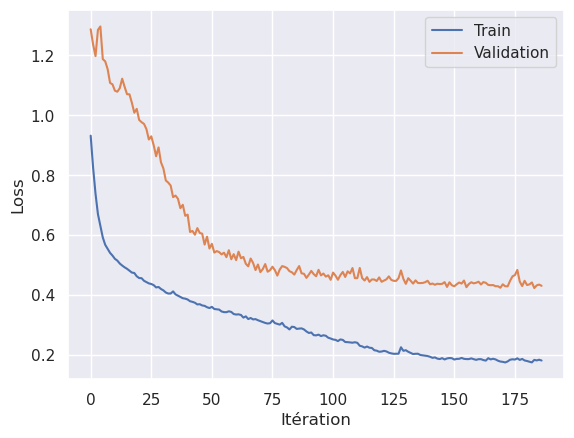

In [83]:
plt.plot(result_5.index[start:], result_5["loss"][start:])
plt.plot(result_5.index[start:], result_5["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


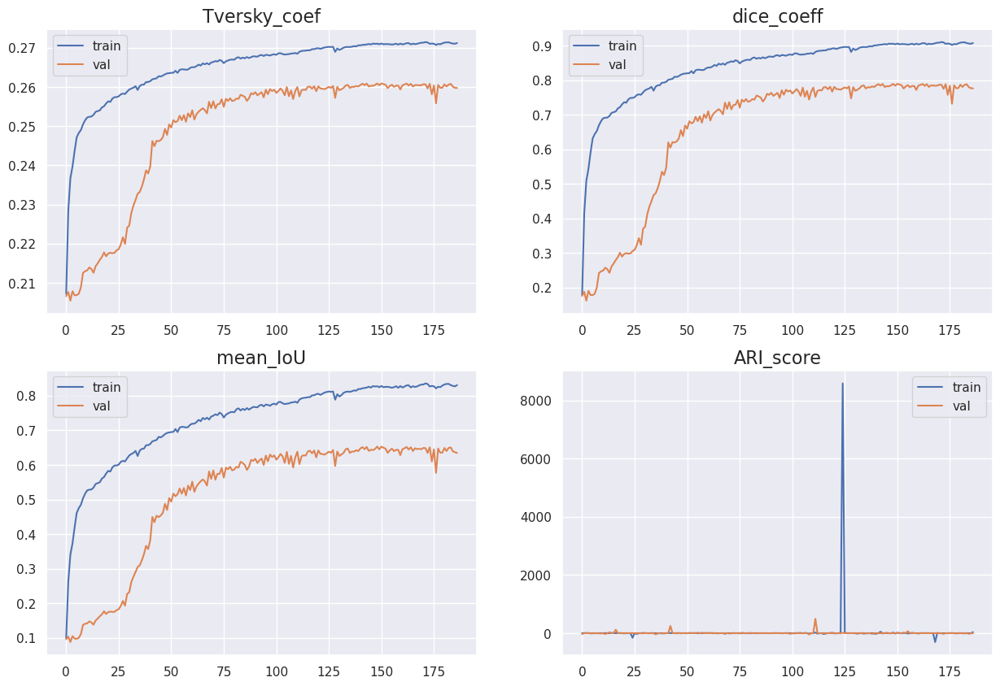

In [84]:
afficher_les_metriques( result_5 )

In [85]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, False, augmentation=aug_5, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [86]:
img.shape

(10, 128, 256, 3)

In [87]:
mask.shape

(10, 128, 256, 8)

In [88]:
mask_pred = model_5.predict(img)

1/1 [==============================] - 2s 2s/step


In [89]:
mask_pred.shape

(10, 128, 256, 8)

In [90]:
transformer = Mask_To_8_Groups()

In [91]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

In [92]:
np.unique( mask_pred )

array([0, 1, 2, 3, 4, 5, 6, 7])

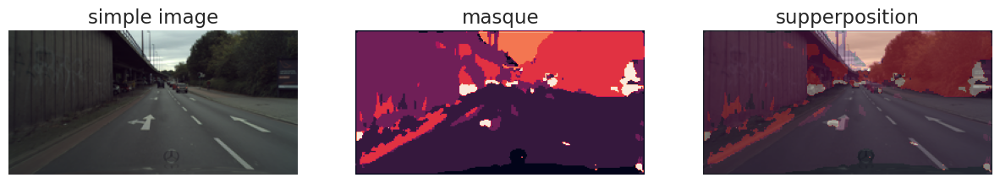

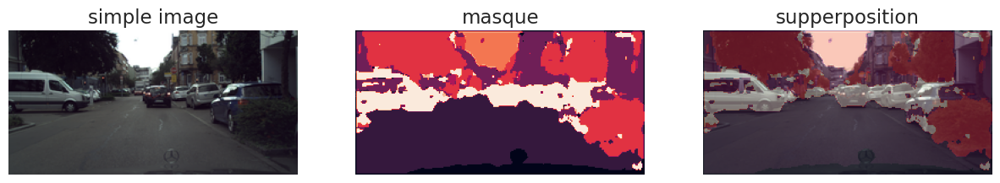

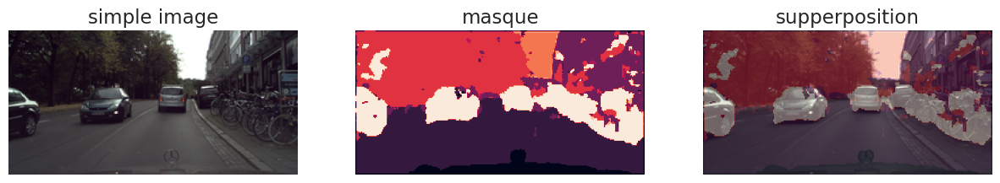

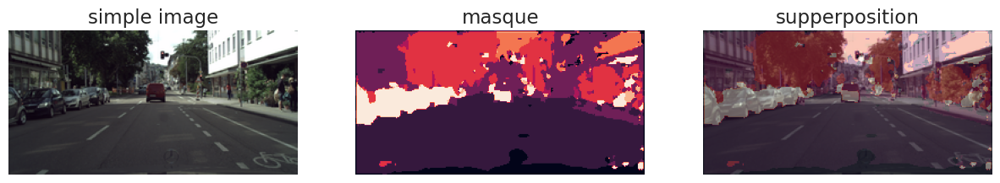

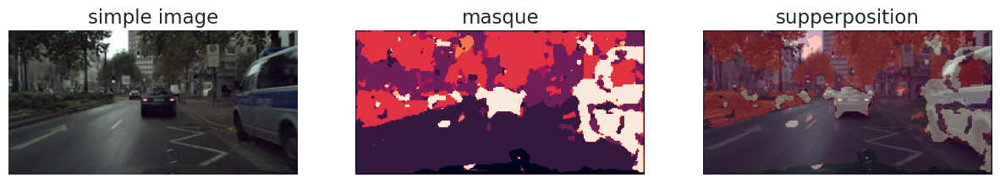

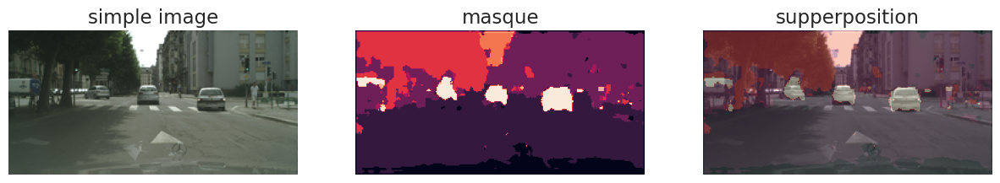

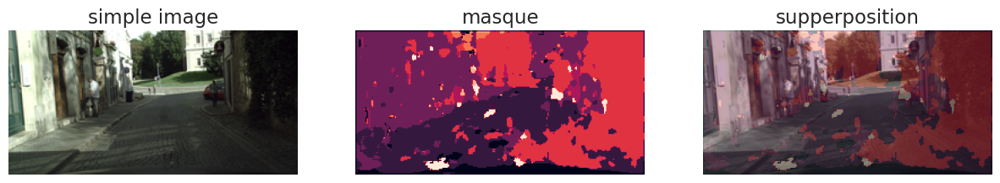

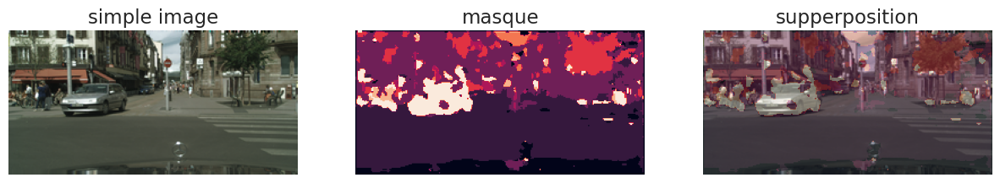

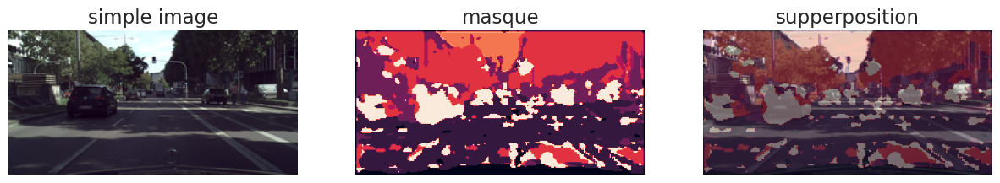

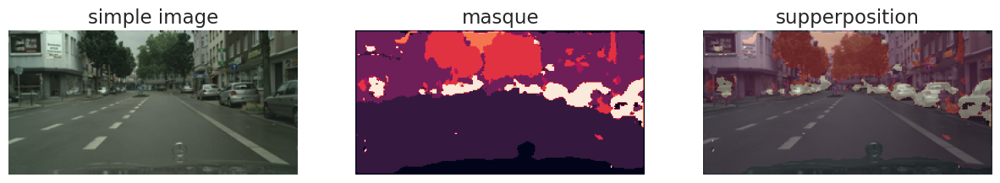

In [93]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

In [94]:
recap = pd.DataFrame([result_1.iloc[-result_1.shape[0]//2:,:].max().values , 
                      result_2.iloc[-result_2.shape[0]//2:,:].max().values,
                      result_3.iloc[-result_3.shape[0]//2:,:].max().values, 
                      result_4.iloc[-result_4.shape[0]//2:,:].max().values,
                      result_5.iloc[-result_5.shape[0]//2:,:].max().values
                     ],
                     columns= result_1.keys()
                    ).drop(["loss","ARI_score","val_ARI_score","val_loss"], axis = 1)

recap

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.813244,0.896992,0.270263,0.619135,0.763617,0.258577,Transfert_learning_LinkNET,jaccard_loss,False
1,0.561368,0.718963,0.254621,0.488063,0.654458,0.248815,Transfert_learning_LinkNET,dice_loss,False
2,0.455832,0.626144,0.247509,0.340543,0.507972,0.236986,Transfert_learning_LinkNET,categorical_focal_loss,False
3,0.851575,0.919810,0.272310,0.579748,0.733853,0.255934,Transfert_learning_LinkNET,categorical_focal_jaccard_loss,False
4,0.835549,0.910406,0.271481,0.653147,0.789402,0.260910,Transfert_learning_LinkNET,categorical_focal_dice_loss,False


In [95]:
recap.style.highlight_min(axis=0, color='red').highlight_max(axis=0, color='green')

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.813244,0.896992,0.270263,0.619135,0.763617,0.258577,Transfert_learning_LinkNET,jaccard_loss,False
1,0.561368,0.718963,0.254621,0.488063,0.654458,0.248815,Transfert_learning_LinkNET,dice_loss,False
2,0.455832,0.626144,0.247509,0.340543,0.507972,0.236986,Transfert_learning_LinkNET,categorical_focal_loss,False
3,0.851575,0.919810,0.272310,0.579748,0.733853,0.255934,Transfert_learning_LinkNET,categorical_focal_jaccard_loss,False
4,0.835549,0.910406,0.271481,0.653147,0.789402,0.260910,Transfert_learning_LinkNET,categorical_focal_dice_loss,False


In [96]:
#if "recap.csv" in os.listdir() : 
#    x = pd.read_csv("recep.csv")
#    recap = pd.concat([x , recap], axis = 0, ignore_index=True)
#    recap.drop_duplicates(["modèle","Loss","Augmentation"], inplace=True)

recap.to_csv(f"recap_{model_name}.csv", index = False)
